In [1]:
import os
from pathlib import Path

import spateo as st

2023-10-03 15:52:46.235956: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
cpo = [(41, 1209, 57), (13, 8, -3), (0, 0, 1)]
 
sample_id = "E8_9h"
# os.chdir(f"/media/user/Drosophila_Data/drosophila_v3/3d_reconstruction_yao/drosophila_{sample_id}")
os.chdir(f"/media/pc001/Yao/Projects/Project_drosophila/Data_v4/migration-hotspot/drosophila_{sample_id}")
out_image_path = f"image/review_tissue_models"
Path(out_image_path).mkdir(parents=True, exist_ok=True)

embryo_pc = st.tdr.read_model(f"pc_models/0_Embryo_{sample_id}_aligned_pc_model.vtk")
embryo_mesh = st.tdr.read_model(f"mesh_models_new/0_Embryo_{sample_id}_aligned_mesh_model.vtk")

## Tissue

In [3]:
tissue_names = ['CNS',  'Midgut', 'Hindgut', 'Muscle', 'SalivaryGland']
tissue_sample_ids = ["CNS", "midgut", "hindgut", "muscle", "salivary gland"]
tissue_adatas, tissue_pcs, tissue_meshes = [], [], []

for i, tissue_name in enumerate(tissue_names):
    tissue_pc = st.tdr.read_model(f"pc_models/{i+1}_{tissue_name}_{sample_id}_aligned_pc_model.vtk")
    tissue_mesh = st.tdr.read_model(f"mesh_models_new/{i+1}_{tissue_name}_{sample_id}_aligned_mesh_model.vtk")
    tissue_pcs.append(tissue_pc)
    tissue_meshes.append(tissue_mesh)

## Point clouds

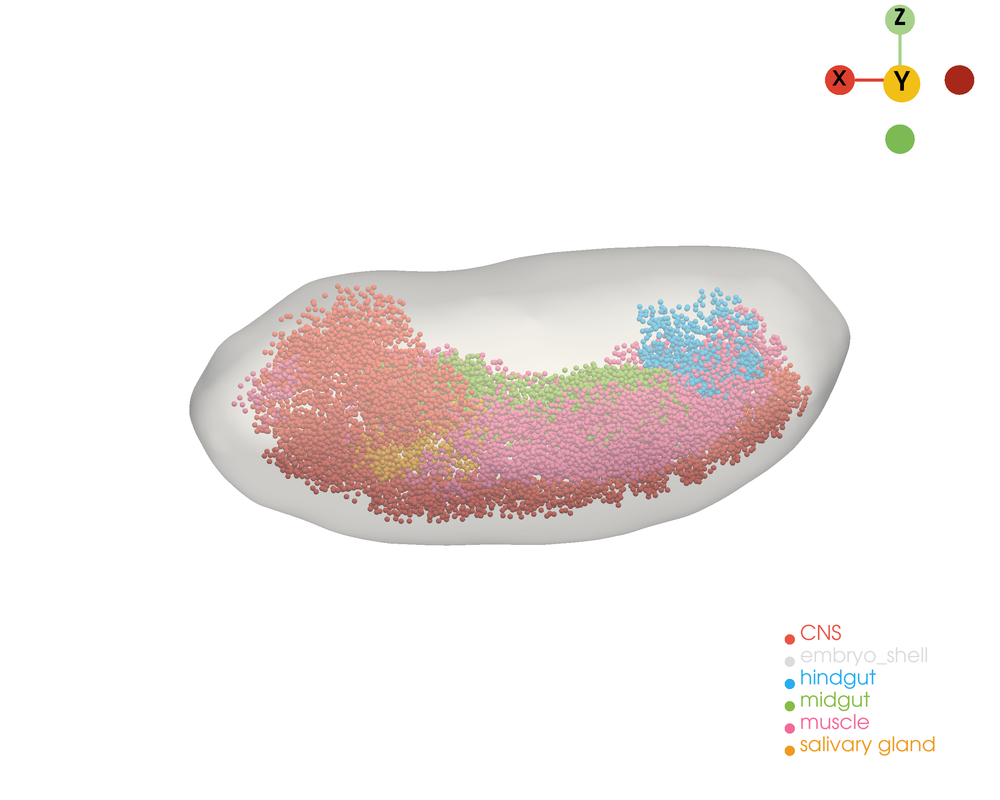

In [4]:
vis_pc_models = [embryo_mesh] + tissue_pcs
st.pl.three_d_plot(
        model=st.tdr.collect_models(vis_pc_models),
        key="tissue",
        model_style=["surface", "points", "points", "points", "points", "points"],
        model_size=14,
        opacity=[0.8, 1, 1, 1, 1, 1],
        cpo=cpo,
        window_size=(2560, 2048),
        jupyter="static",
        filename=os.path.join(out_image_path, f"{sample_id}_complete_pc_model.pdf")
    )

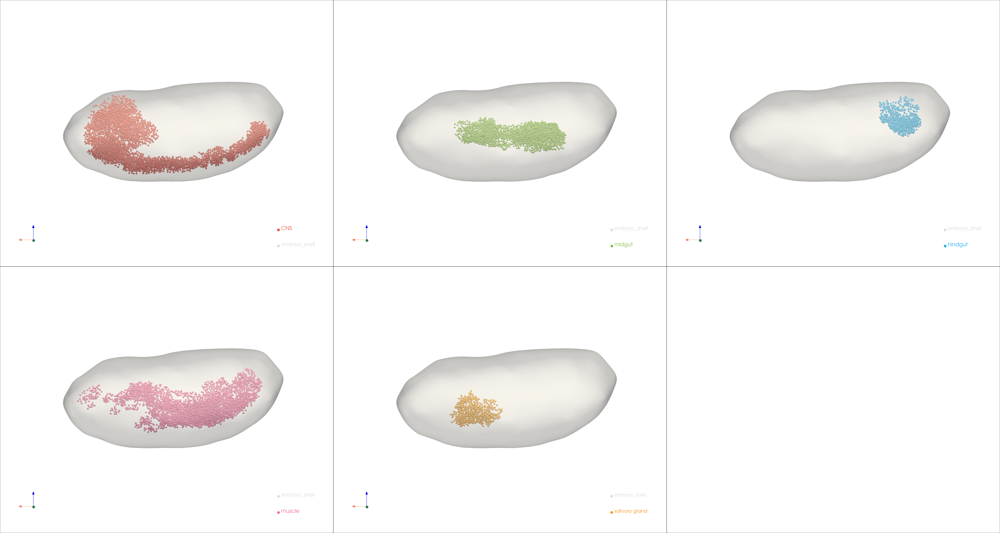

In [5]:
st.pl.three_d_multi_plot(
    model=st.tdr.collect_models([st.tdr.collect_models([embryo_mesh, tissue_pc]) for tissue_pc in tissue_pcs]),
    key="tissue",
    model_style=[["surface", "points"]],
    opacity=[[0.8, 1]],
    model_size=14,
    shape=(2, 3),
    window_size=(2560, 2048),
    jupyter="static",
    cpo=[cpo],
    filename=os.path.join(out_image_path, f"{sample_id}_multi_pc_models.pdf")
)

## Mesh

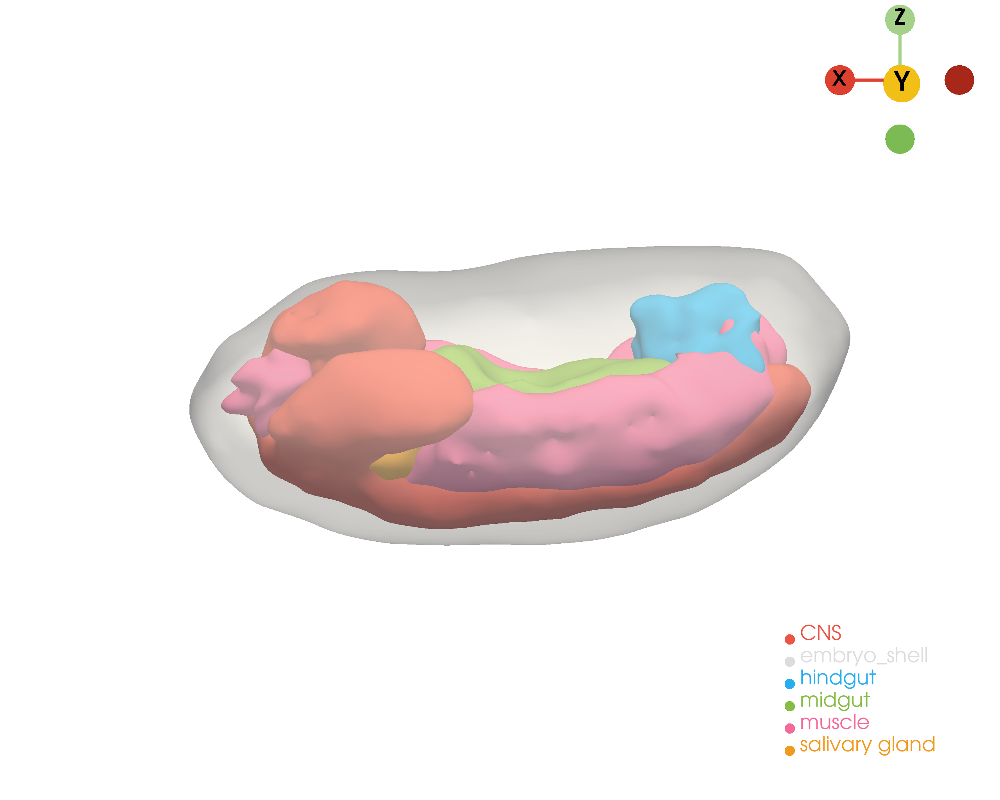

In [6]:
vis_mesh_models = [embryo_mesh] + tissue_meshes
st.pl.three_d_plot(
        model=st.tdr.collect_models(vis_mesh_models),
        key="tissue",
        model_style="surface",
        opacity=[0.8, 1, 1, 1, 1, 1],
        cpo=cpo,
        window_size=(2560, 2048),
        jupyter="static",
        filename=os.path.join(out_image_path, f"{sample_id}_complete_mesh_model.pdf")
    )

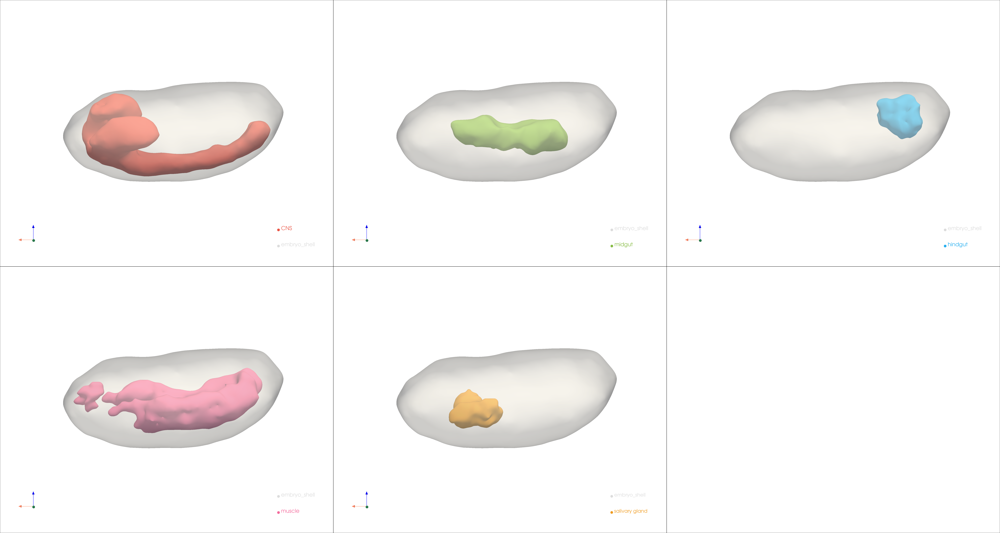

In [7]:
st.pl.three_d_multi_plot(
    model=st.tdr.collect_models([st.tdr.collect_models([embryo_mesh, tissue_mesh]) for tissue_mesh in tissue_meshes]),
    key="tissue",
    model_style="surface",
    opacity=[[0.8, 1]],
    shape=(2, 3),
    window_size=(2560, 2048),
    jupyter="static",
    cpo=[cpo],
    filename=os.path.join(out_image_path, f"{sample_id}_multi_mesh_models.pdf")
)

## Point clouds without shell

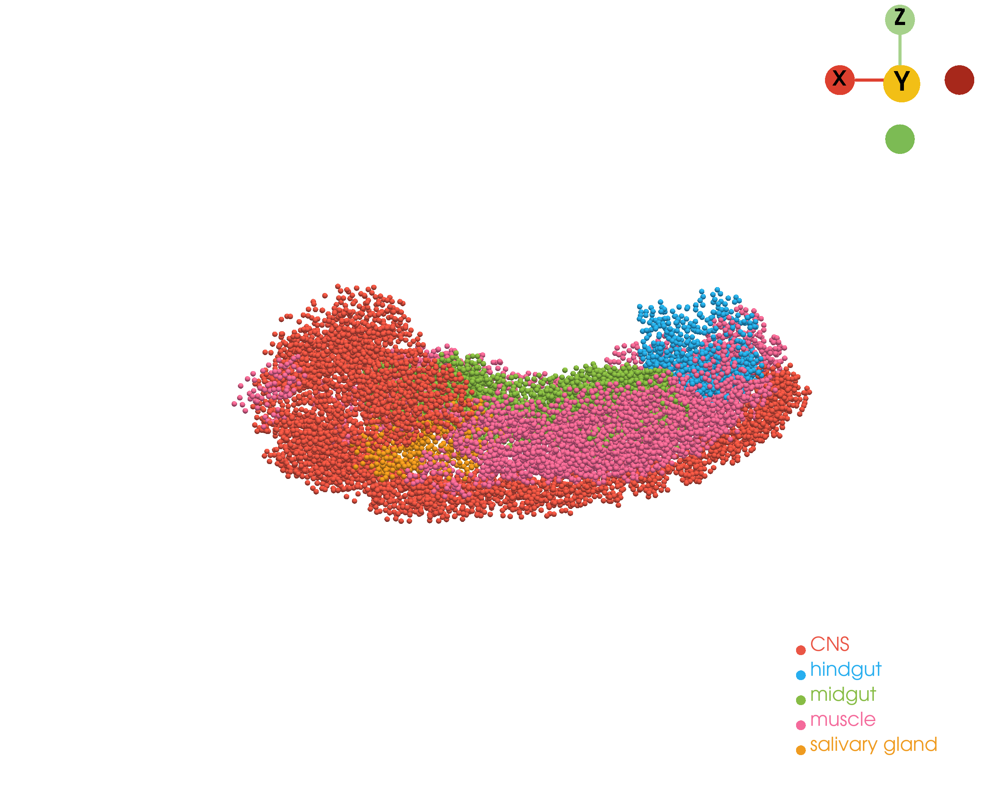

In [4]:
vis_pc_models = tissue_pcs.copy()
st.pl.three_d_plot(
        model=st.tdr.collect_models(vis_pc_models),
        key="tissue",
        model_style="points",
        model_size=14,
        opacity=1,
        cpo=cpo,
        window_size=(2560, 2048),
        jupyter="static",
        filename=os.path.join(out_image_path, f"{sample_id}_complete_pc_model_without_shell.pdf")
    )

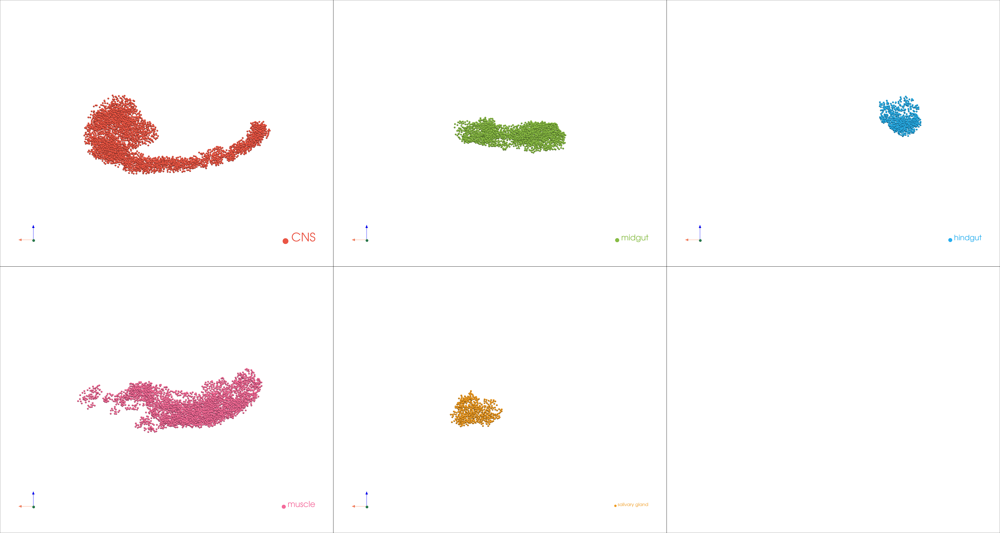

In [5]:
st.pl.three_d_multi_plot(
    model=st.tdr.collect_models(tissue_pcs.copy()),
    key="tissue",
    model_style="points",
    opacity=1,
    model_size=14,
    shape=(2, 3),
    window_size=(2560, 2048),
    jupyter="static",
    cpo=[cpo],
    filename=os.path.join(out_image_path, f"{sample_id}_multi_pc_models_without_shell.pdf")
)

## Mesh without shell

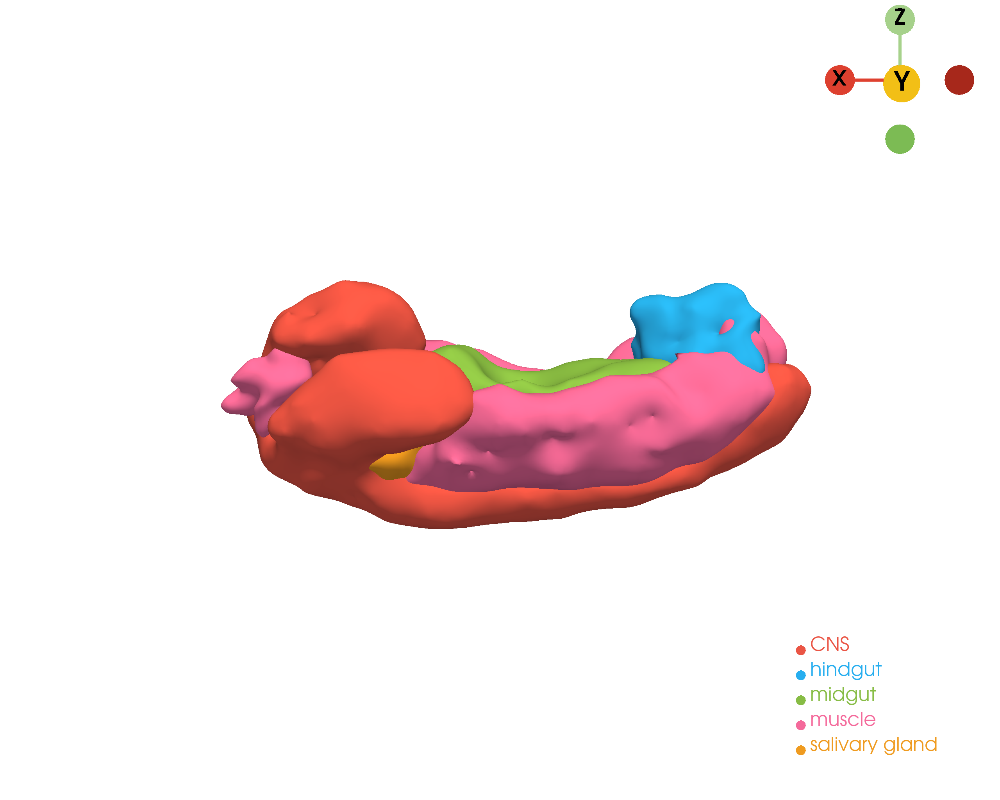

In [6]:
vis_mesh_models = tissue_meshes.copy()
st.pl.three_d_plot(
        model=st.tdr.collect_models(vis_mesh_models),
        key="tissue",
        model_style="surface",
        opacity=1,
        cpo=cpo,
        window_size=(2560, 2048),
        jupyter="static",
        filename=os.path.join(out_image_path, f"{sample_id}_complete_mesh_model_without_shell.pdf")
    )

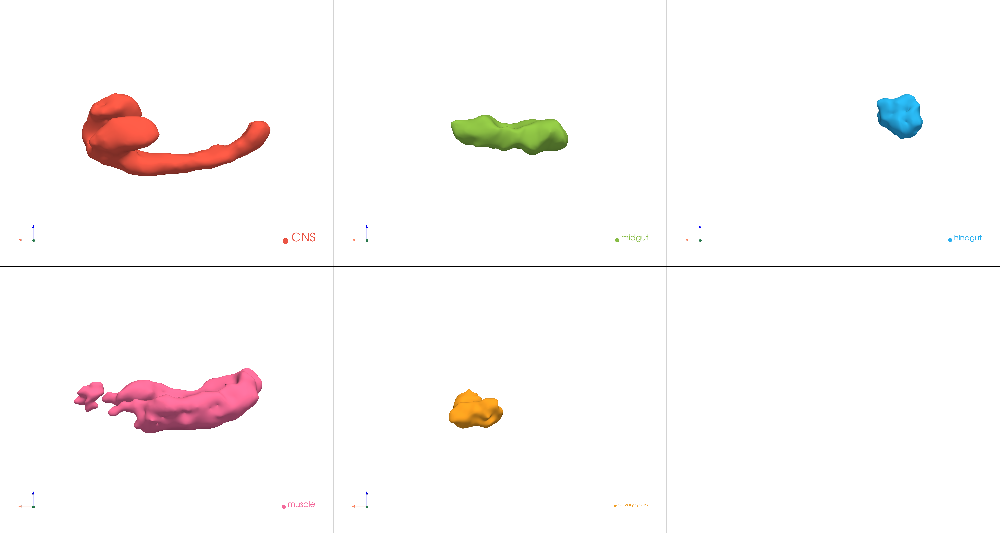

In [7]:
st.pl.three_d_multi_plot(
    model=st.tdr.collect_models(tissue_meshes.copy()),
    key="tissue",
    model_style="surface",
    opacity=1,
    shape=(2, 3),
    window_size=(2560, 2048),
    jupyter="static",
    cpo=[cpo],
    filename=os.path.join(out_image_path, f"{sample_id}_multi_mesh_models_without_shell.pdf")
)